# Identifying Normal versus Abnormal Heart Sounds

Heart disease is one of the top causes of death throughout the world and often times if irregularities are identified soon enough preventative measures can be taken. The healthy heart makes a distinct ‘lub-dub’ sound at regular intervals. When there is disease or issues within the heart itself, such as defective valves, the sound patterns begin to diverge and this is something that trained health professionals can typically pickup on these abnormalities. By training a model off of healthy and unhealthy heart recordings, I will attempt to develop a model that can accurately predict the heart’s state and if further action needs to be taken. My idea for an end product would be some sort of software that could be integrated into a stethoscope that when placed on a patient’s heart during evaluation can help the doctor determine if there are any abnormalities in the heartbeat. The value from this would be improved patient care and outcomes which would ultimately lead to lower medical costs in the long run. A product such as this could also potentially be used by people without any medical training to quickly and accurately determine if there is an issue and if further action should be taken.

I will be using two separate datasets, one that contains recordings of heartbeats and another dataset of respiratory recordings. The heartbeat dataset contains over 3,000 recordings of both normal and abnormal heartbeats. The other dataset contains over 900 respiratory recordings and as such there is typically no discernable heartbeat. It will be important to discern this set, which I am labelling as artifacts, from the heartbeats so that anyone gathering the data will no to try again. With these recordings I will build a model to classify heartbeats as normal, abnormal or as an artifact that would cue the doctor to get another recording. My plan is to train the model on the larger dataset and than use the smaller dataset to test on. This will give a good sense of how generalizable the model is and if it would be effective in an actual clinical setting. After processing the data, I will apply both supervised and unsupervised learning techniques on the data in searching for the best performing model. In the end however, I anticipate that using deep learning techniques, particularly an LSTM recurrent neural network which have shown to be effective in such tasks as speech recognition, will ultimately produce the best model. 

In [1]:
# Pandas
import pandas as pd

# Scikit learn
from sklearn import metrics
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, accuracy_score, confusion_matrix
from sklearn.preprocessing import LabelEncoder
from sklearn.utils import shuffle, resample
from sklearn.utils import class_weight
from sklearn.model_selection import cross_val_score

# Keras
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten, LSTM
from keras.layers import Convolution2D, Conv2D, MaxPooling2D, GlobalAveragePooling2D
from keras.utils import to_categorical, np_utils
from keras.optimizers import Adam, RMSprop
from keras.callbacks import EarlyStopping,ReduceLROnPlateau,ModelCheckpoint,TensorBoard,ProgbarLogger

# Audio
import librosa
import librosa.display
import wave
import IPython.display as ipd

# Plot
import matplotlib.pyplot as plt
import seaborn as sns

# Utility
import os
from glob import glob
import numpy as np
from tqdm import tqdm
import itertools
import numpy as np
from scipy.io import wavfile
import fnmatch

Using TensorFlow backend.


## Preprocessing Data

Since I am working with almost exclusively with straight audio files, I will first need to preprocess these files and extract the important features from them that I will use to feed into my models. After some research, the main audio features that appear to be most effective in machine learning are the spectrogram features and mel-frequency cepstrum coefficient (mfcc) features. Below I have functions that I will use to extract these features which I will then feed into dataframes. For the spectrogram and mfcc features, I will take 10 second samples of each file (a few files shorter than 10 seconds will be padded to that time) in an attempt to normalize the data and make sure all my features are of a similar length. 

In [2]:
#Function to get audio duration for each file
def get_recording_times(audio_files):
    data = []
    for file in audio_files:
        y, sr = librosa.load(file, res_type='kaiser_fast')
        dur = librosa.get_duration(y)
        data.append(dur)
    return data

In [3]:
#Function to get mel-frequency cepstral coefficient data for each file
def get_mfcc(audio_files):
    data = []
    for file in audio_files:
        y, sr = librosa.load(file, res_type='kaiser_fast')
        mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=40)
        data.append(mfccs)
    return data

In [4]:
#Function to get mean mfccs for each file with a fix padding, may also chop off some file
def load_file_mfcc (folder,file_names, duration=10, sr=16000):
    input_length=sr*duration
    data = []
    for file_name in file_names:
        try:
            sound_file=folder+file_name
            X, sr = librosa.load( sound_file, sr=sr, duration=duration,res_type='kaiser_fast') 
            dur = librosa.get_duration(y=X, sr=sr)
            # pad audio file same duration
            if (round(dur) < duration):
                y = librosa.util.fix_length(X, input_length)
            mfccs = np.mean(librosa.feature.mfcc(y=X, sr=sr, n_mfcc=40).T,axis=0)             
        except Exception as e:
            print("Error encountered while parsing file: ", file)        
        feature = np.array(mfccs).reshape([-1,1])
        data.append(feature)
    return data

In [5]:
#Function to get spectrogram data for each file with a fix padding, may also chop off some file
def load_file_spec (folder,file_names, duration=10, sr=16000):
    input_length=sr*duration
    data = []
    for file_name in file_names:
        try:
            sound_file=folder+file_name
            X, sr = librosa.load( sound_file, sr=sr, duration=duration,res_type='kaiser_fast') 
            dur = librosa.get_duration(y=X, sr=sr)
            # pad audio file same duration
            if (round(dur) < duration):
                y = librosa.util.fix_length(X, input_length)  
            spec_features = np.mean(librosa.amplitude_to_db(abs(librosa.stft(y)).T), axis=0)
        except Exception as e:
            print("Error encountered while parsing file: ", file_name) 
        data.append(spec_features)
    return data

In [6]:
# Function to flatten out spectrogram and mfcc data
# This is used to easily separate out that data into individual columns that will be used for supervised learning
def flat_(file):
    data=[]
    for x in file:
        flat = x.flatten()
        data.append(flat)
    return data

### Load data

In [7]:
#load dataset-a
set_a = pd.read_csv(r'\Users\mike1\Documents\Thinkful\training\training-a\REFERENCE.csv')
set_a['Status'] = np.where(set_a['Label'] >= 0, 'abnormal', 'normal')

#load dataset-b
set_b = pd.read_csv(r'\Users\mike1\Documents\Thinkful\training\training-b\REFERENCE.csv')
set_b['Status'] = np.where(set_b['Label'] >= 0, 'abnormal', 'normal')

#load dataset-c
set_c = pd.read_csv(r'\Users\mike1\Documents\Thinkful\training\training-c\REFERENCE.csv')
set_c['Status'] = np.where(set_c['Label'] >= 0, 'abnormal', 'normal')

#load dataset-d
set_d = pd.read_csv(r'\Users\mike1\Documents\Thinkful\training\training-d\REFERENCE.csv')
set_d['Status'] = np.where(set_d['Label'] >= 0, 'abnormal', 'normal')

#load dataset-e
set_e = pd.read_csv(r'\Users\mike1\Documents\Thinkful\training\training-e\REFERENCE.csv')
set_e['Status'] = np.where(set_e['Label'] >= 0, 'abnormal', 'normal')

#load dataset-f
set_f = pd.read_csv(r'\Users\mike1\Documents\Thinkful\training\training-f\REFERENCE.csv')
set_f['Status'] = np.where(set_f['Label'] >= 0, 'abnormal', 'normal')

In [8]:
data = './Documents/Thinkful/training/training-a'
audio_files_a = glob(data + '/*.wav')
print("Number of files in set a:", len(audio_files_a))

data = './Documents/Thinkful/training/training-b'
audio_files_b = glob(data + '/*.wav')
print("Number of files in set b:", len(audio_files_b))

data = './Documents/Thinkful/training/training-c'
audio_files_c = glob(data + '/*.wav')
print("Number of files in set c:", len(audio_files_c))

data = './Documents/Thinkful/training/training-d'
audio_files_d = glob(data + '/*.wav')
print("Number of files in set d:", len(audio_files_d))

data = './Documents/Thinkful/training/training-e'
audio_files_e = glob(data + '/*.wav')
print("Number of files in set e:", len(audio_files_e))

data = './Documents/Thinkful/training/training-f'
audio_files_f = glob(data + '/*.wav')
print("Number of files in set f:", len(audio_files_f))

data = './Documents/audio_and_txt_files'
audio_files_artifacts = glob(data + '/*.wav')
print("Number of artifact files:", len(audio_files_artifacts))

Number of files in set a: 409
Number of files in set b: 490
Number of files in set c: 31
Number of files in set d: 55
Number of files in set e: 2141
Number of files in set f: 114
Number of artifact files: 920


#### Get duration of each file

In [21]:
set_a['duration'] = np.asarray(get_recording_times(audio_files_a))

In [22]:
set_b['duration'] = np.asarray(get_recording_times(audio_files_b))

In [23]:
set_c['duration'] = np.asarray(get_recording_times(audio_files_c))

In [24]:
set_d['duration'] = np.asarray(get_recording_times(audio_files_d))

In [25]:
set_e['duration'] = np.asarray(get_recording_times(audio_files_e))

In [26]:
set_f['duration'] = np.asarray(get_recording_times(audio_files_f))

In [27]:
#Create artifact dataframe
artifact = pd.DataFrame()
artifact['duration'] = np.asarray(get_recording_times(audio_files_artifacts))
artifact['Label'] = 2
artifact['Status'] = 'artifact'

#### Get spectrogram data into data frames

In [10]:
# parent folder of sound files
INPUT_DIR = "./Documents"
# 16 KHz
SAMPLE_RATE = 16000
# seconds
MAX_SOUND_CLIP_DURATION = 10

In [11]:
A_folder=INPUT_DIR+'/Thinkful/training/training-a/'

A_files = fnmatch.filter(os.listdir(INPUT_DIR+'/Thinkful/training/training-a/'), 'a0*.wav')
A_sounds_spec = load_file_spec(folder=A_folder,file_names=A_files, duration=40)

set_a['spec'] = A_sounds_spec

In [16]:
B_folder=INPUT_DIR+'/Thinkful/training/training-b/'

B_files = fnmatch.filter(os.listdir(INPUT_DIR+'/Thinkful/training/training-b/'), 'b0*.wav')
B_sounds_spec = load_file_spec(folder=B_folder,file_names=B_files, duration=MAX_SOUND_CLIP_DURATION)

set_b['spec'] = B_sounds_spec

In [18]:
C_folder=INPUT_DIR+'/Thinkful/training/training-c/'

C_files = fnmatch.filter(os.listdir(INPUT_DIR+'/Thinkful/training/training-c/'), 'c0*.wav')
C_sounds_spec = load_file_spec(folder=C_folder, file_names=C_files, duration=130)

set_c['spec'] = C_sounds_spec

In [34]:
D_folder=INPUT_DIR+'/Thinkful/training/training-d/'

D_files = fnmatch.filter(os.listdir(INPUT_DIR+'/Thinkful/training/training-d/'), 'd0*.wav')
D_sounds_spec = load_file_spec(folder=D_folder, file_names=D_files, duration=MAX_SOUND_CLIP_DURATION)

set_d['spec'] = D_sounds_spec

In [15]:
E_folder=INPUT_DIR+'/Thinkful/training/training-e/'

E_files = fnmatch.filter(os.listdir(INPUT_DIR+'/Thinkful/training/training-e/'), 'e*.wav')
E_sounds_spec = load_file_spec(folder=E_folder, file_names=E_files, duration=110)

set_e['spec'] = E_sounds_spec

In [20]:
F_folder=INPUT_DIR+'/Thinkful/training/training-f/'

F_files = fnmatch.filter(os.listdir(INPUT_DIR+'/Thinkful/training/training-f/'), 'f0*.wav')
F_sounds_spec = load_file_spec(folder=F_folder, file_names=F_files, duration=60)

set_f['spec'] = F_sounds_spec

In [29]:
artifact_folder=INPUT_DIR+'/audio_and_txt_files/'

artifact_files = fnmatch.filter(os.listdir(INPUT_DIR+'/audio_and_txt_files/'), '*.wav')
artifact_sounds_spec = load_file_spec(folder=artifact_folder, file_names=artifact_files, duration=60)

artifact['spec'] = artifact_sounds_spec

#### Get mean mfccs into data frame

In [38]:
A_sounds_mfcc = load_file_mfcc(folder=A_folder,file_names=A_files, duration=MAX_SOUND_CLIP_DURATION)

set_a['mean_mfccs'] = A_sounds_mfcc
set_a['mfccs_flat'] = flat_(A_sounds_mfcc)
set_a.head()

,File,Label,Status,spec,duration,mean_mfccs,mfccs_flat
0,a0001,1,abnormal,"[-9.171589, 3.0506287, 7.169695, 6.622905, 5.4...",35.666032,"[[-584.12305], [131.81575], [86.7822], [35.868...","[-584.12305, 131.81575, 86.7822, 35.868633, 0...."
1,a0002,1,abnormal,"[-28.73069, -23.622662, -22.500126, -22.153763...",20.828526,"[[-624.69977], [154.64249], [103.97029], [47.4...","[-624.69977, 154.64249, 103.97029, 47.453476, ..."
2,a0003,1,abnormal,"[-13.780017, -4.433834, -0.92567724, -1.384932...",30.720000,"[[-591.2136], [86.8231], [65.5765], [41.115738...","[-591.2136, 86.8231, 65.5765, 41.115738, 23.12..."
3,a0004,1,abnormal,"[-2.8186977, 5.1459503, 7.233802, 6.9854603, 6...",35.596508,"[[-551.03973], [101.06604], [77.66607], [49.60...","[-551.03973, 101.06604, 77.66607, 49.601433, 2..."
4,a0005,1,abnormal,"[-5.668121, 6.434245, 12.086626, 15.368168, 16...",35.666032,"[[-479.96585], [74.80587], [62.644917], [47.63...","[-479.96585, 74.80587, 62.644917, 47.637768, 3..."


In [31]:
B_sounds_mfcc = load_file_mfcc(folder=B_folder, file_names=B_files, duration=MAX_SOUND_CLIP_DURATION)

set_b['mean_mfccs'] = B_sounds_mfcc
set_b['mfccs_flat'] = flat_(B_sounds_mfcc)
set_b.head()

,File,Label,Status,spec,duration,mean_mfccs,mfccs_flat
0,b0001,-1,normal,"[28.591928, 27.277462, 22.107761, 16.9386, 12....",8.0,"[[-428.33002], [89.19388], [69.03256], [45.329...","[-428.33002, 89.19388, 69.03256, 45.32981, 26...."
1,b0002,-1,normal,"[19.31973, 21.57377, 18.877474, 15.376634, 12....",8.0,"[[-444.91922], [61.66955], [55.937687], [48.34...","[-444.91922, 61.66955, 55.937687, 48.345165, 4..."
2,b0003,-1,normal,"[23.082237, 24.30253, 20.526178, 16.217812, 12...",8.0,"[[-442.75323], [67.52865], [56.93366], [43.824...","[-442.75323, 67.52865, 56.93366, 43.824787, 32..."
3,b0004,-1,normal,"[32.920372, 28.88484, 21.888977, 14.855255, 10...",8.0,"[[-415.27402], [128.11131], [93.46588], [52.79...","[-415.27402, 128.11131, 93.46588, 52.798344, 1..."
4,b0005,-1,normal,"[32.55472, 27.802837, 15.463462, 10.532642, 8....",8.0,"[[-440.1965], [111.85874], [83.767715], [50.96...","[-440.1965, 111.85874, 83.767715, 50.969475, 2..."


In [32]:
C_sounds_mfcc = load_file_mfcc(folder=C_folder, file_names=C_files, duration=MAX_SOUND_CLIP_DURATION)

set_c['mean_mfccs'] = C_sounds_mfcc
set_c['mfccs_flat'] = flat_(C_sounds_mfcc)
set_c.head()

,File,Label,Status,spec,duration,mean_mfccs,mfccs_flat
0,c0001,1,abnormal,"[-35.030838, -33.556297, -33.422028, -33.90941...",22.723039,"[[-596.31177], [68.49968], [58.036194], [45.15...","[-596.31177, 68.49968, 58.036194, 45.15881, 33..."
1,c0002,1,abnormal,"[-40.48983, -39.734806, -39.4253, -39.4194, -3...",11.576508,"[[-603.52515], [73.355804], [62.480667], [49.0...","[-603.52515, 73.355804, 62.480667, 49.04001, 3..."
2,c0003,-1,normal,"[-17.63324, -15.277745, -14.933746, -15.765161...",32.647528,"[[-397.82587], [111.454], [85.508156], [54.784...","[-397.82587, 111.454, 85.508156, 54.78457, 29...."
3,c0004,1,abnormal,"[-18.300396, -13.579968, -12.627368, -13.73281...",57.472517,"[[-575.80817], [64.47537], [56.450996], [46.93...","[-575.80817, 64.47537, 56.450996, 46.933193, 3..."
4,c0005,1,abnormal,"[-45.487835, -44.753365, -44.403526, -44.23796...",9.649025,"[[-619.18054], [81.033226], [65.58317], [47.87...","[-619.18054, 81.033226, 65.58317, 47.877953, 3..."


In [35]:
D_sounds_mfcc = load_file_mfcc(folder=D_folder, file_names=D_files, duration=MAX_SOUND_CLIP_DURATION)

set_d['mean_mfccs'] = D_sounds_mfcc
set_d['mfccs_flat'] = flat_(D_sounds_mfcc)
set_d.head()

,File,Label,Status,duration,spec,mean_mfccs,mfccs_flat
0,d0001,-1,normal,6.607528,"[-6.5819316, -1.1721641, -1.1397847, -4.173267...","[[-586.3175], [89.829056], [73.24019], [52.525...","[-586.3175, 89.829056, 73.24019, 52.525528, 33..."
1,d0002,1,abnormal,10.846531,"[-6.5819316, -1.1721641, -1.1397847, -4.173267...","[[-662.9022], [101.23994], [79.77684], [52.800...","[-662.9022, 101.23994, 79.77684, 52.800724, 28..."
2,d0003,1,abnormal,11.040000,"[-6.5819316, -1.1721641, -1.1397847, -4.173267...","[[-590.3947], [83.68325], [68.02001], [48.6889...","[-590.3947, 83.68325, 68.02001, 48.68895, 32.1..."
3,d0004,1,abnormal,9.514014,"[-6.5819316, -1.1721641, -1.1397847, -4.173267...","[[-720.0838], [150.38322], [108.2894], [58.586...","[-720.0838, 150.38322, 108.2894, 58.58677, 19...."
4,d0005,-1,normal,9.417506,"[16.94314, 21.64326, 20.737265, 16.426098, 11....","[[-509.1679], [76.076904], [64.01096], [48.952...","[-509.1679, 76.076904, 64.01096, 48.95294, 35...."


In [40]:
E_sounds_mfcc = load_file_mfcc(folder=E_folder, file_names=E_files, duration=MAX_SOUND_CLIP_DURATION)

set_e['mean_mfccs'] = E_sounds_mfcc
set_e['mfccs_flat'] = flat_(E_sounds_mfcc)
set_e.head()

,File,Label,Status,spec,duration,mean_mfccs,mfccs_flat
0,e00001,-1,normal,"[-7.8511887, -8.764219, -11.932959, -12.899453...",20.919002,"[[-465.75858], [47.31818], [37.96549], [27.188...","[-465.75858, 47.31818, 37.96549, 27.188383, 18..."
1,e00002,-1,normal,"[-29.45459, -30.7793, -32.879967, -32.47791, -...",24.177007,"[[-544.956], [120.42578], [89.82577], [53.5503...","[-544.956, 120.42578, 89.82577, 53.55032, 25.2..."
2,e00003,-1,normal,"[-28.941137, -30.048819, -30.998043, -30.74319...",21.173016,"[[-478.6166], [133.9187], [94.96364], [50.5036...","[-478.6166, 133.9187, 94.96364, 50.50369, 18.7..."
3,e00004,-1,normal,"[-29.340307, -28.269104, -27.417292, -26.95999...",19.755011,"[[-456.19385], [124.33627], [91.61739], [53.64...","[-456.19385, 124.33627, 91.61739, 53.646965, 2..."
4,e00005,-1,normal,"[-21.524736, -22.596838, -22.774305, -22.96900...",34.109025,"[[-475.6574], [127.82393], [85.256035], [37.19...","[-475.6574, 127.82393, 85.256035, 37.19874, 3...."


In [41]:
F_sounds_mfcc = load_file_mfcc(folder=F_folder, file_names=F_files, duration=MAX_SOUND_CLIP_DURATION)

set_f['mean_mfccs'] = F_sounds_mfcc
set_f['mfccs_flat'] = flat_(F_sounds_mfcc)
set_f.head()

,File,Label,Status,spec,duration,mean_mfccs,mfccs_flat
0,f0001,-1,normal,"[-24.825594, -20.516573, -16.06194, -13.41194,...",31.824036,"[[-457.0023], [150.62352], [103.12862], [47.41...","[-457.0023, 150.62352, 103.12862, 47.41841, 4...."
1,f0002,-1,normal,"[-22.974632, -19.382671, -15.430416, -12.08418...",30.336009,"[[-431.00134], [160.76947], [107.860275], [46....","[-431.00134, 160.76947, 107.860275, 46.743397,..."
2,f0003,1,abnormal,"[-25.53134, -22.253828, -18.0869, -15.076668, ...",31.824036,"[[-466.4491], [171.6018], [110.55385], [41.499...","[-466.4491, 171.6018, 110.55385, 41.49928, -6...."
3,f0004,-1,normal,"[-21.238646, -17.25582, -12.017487, -7.8997684...",35.136009,"[[-453.95312], [149.65536], [102.850105], [48....","[-453.95312, 149.65536, 102.850105, 48.202785,..."
4,f0005,-1,normal,"[-19.758648, -15.557352, -10.091608, -5.999944...",39.744036,"[[-458.92902], [157.95464], [108.54861], [51.1...","[-458.92902, 157.95464, 108.54861, 51.18382, 8..."


In [42]:
artifact_sounds_mfcc = load_file_mfcc(folder=artifact_folder, file_names=artifact_files, duration=MAX_SOUND_CLIP_DURATION)

artifact['mean_mfccs'] = artifact_sounds_mfcc
artifact['mfccs_flat'] = flat_(artifact_sounds_mfcc)
artifact.head()

,duration,Label,Status,spec,mean_mfccs,mfccs_flat
0,20.000000,2,artifact,"[-21.463089, -19.83664, -19.923443, -21.105461...","[[-515.4341], [115.19924], [73.94003], [43.920...","[-515.4341, 115.19924, 73.94003, 43.92044, 33...."
1,20.000000,2,artifact,"[-21.961945, -20.220259, -20.623728, -22.03842...","[[-575.0297], [100.97194], [56.564903], [32.80...","[-575.0297, 100.97194, 56.564903, 32.800453, 3..."
2,20.000000,2,artifact,"[-25.513311, -24.381224, -25.369997, -27.10382...","[[-575.7482], [124.29727], [52.820705], [22.04...","[-575.7482, 124.29727, 52.820705, 22.040546, 3..."
3,20.000000,2,artifact,"[-5.5459514, -3.052811, -4.1612654, -7.761013,...","[[-411.36203], [73.45972], [49.729664], [33.90...","[-411.36203, 73.45972, 49.729664, 33.908005, 2..."
4,15.856009,2,artifact,"[-16.801785, -16.13805, -15.770612, -15.683567...","[[-432.289], [120.26443], [77.50684], [34.9688...","[-432.289, 120.26443, 77.50684, 34.968845, 9.9..."


#### Join all sets into one data frame

In [43]:
frames = [set_a, set_b, set_c, set_d, set_e, set_f, artifact]
heart_sounds = pd.concat(frames)
heart_sounds.loc[heart_sounds.Label == -1, 'Label'] = 0
print(heart_sounds.info())

C:\Users\mike1\Anaconda3\lib\site-packages\ipykernel_launcher.py:2: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  


<class 'pandas.core.frame.DataFrame'>
Int64Index: 4160 entries, 0 to 919
Data columns (total 7 columns):
File          3240 non-null object
Label         4160 non-null int64
Status        4160 non-null object
duration      4160 non-null float64
mean_mfccs    4160 non-null object
mfccs_flat    4160 non-null object
spec          4160 non-null object
dtypes: float64(1), int64(1), object(5)
memory usage: 260.0+ KB
None


## Data Exploration

normal      2575
artifact     920
abnormal     665
Name: Status, dtype: int64


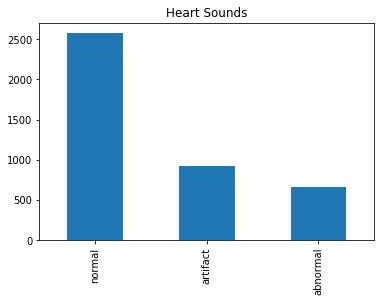

In [44]:
print(heart_sounds['Status'].value_counts())

heart_sounds['Status'].value_counts().plot.bar(title = "Heart Sounds")

Average recording time: 22.247396203994427 seconds
Smallest recording time: 5.305532879818594 seconds
Longest recording time: 121.99850340136054 seconds


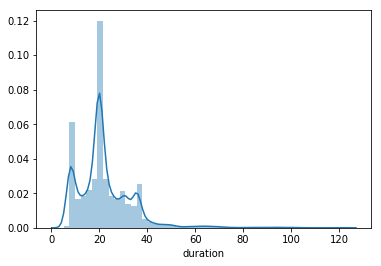

In [45]:
# Time Distribution
print("Average recording time:", np.mean(heart_sounds['duration']), "seconds")
print("Smallest recording time:", np.min(heart_sounds['duration']), "seconds")
print("Longest recording time:", np.max(heart_sounds['duration']), "seconds")

sns.distplot(heart_sounds['duration'])

We see that in our training dataset there appear to be more normal heart sounds than abnormal. This will be important to consider once we begin modelling. Also, from the time distribution we see that the recordings last predominantly between 5 and 40 seconds. But for now let's listen to some hearts. 

### Audio Recordings

1. Normal case

In the Normal category there are normal, healthy heart sounds. These may contain noise in the final second of the recording as the device is removed from the body. They may contain a variety of background noises (from traffic to radios). They may also contain occasional random noise corresponding to breathing, or brushing the microphone against clothing or skin. A normal heart sound has a clear “lub dub, lub dub” pattern, with the time from “lub” to “dub” shorter than the time from “dub” to the next “lub” (when the heart rate is less than 140 beats per minute)(source: Rita Getz)

In [46]:
# A normal heart sound from set-a
ipd.Audio(audio_files_a[9]) 

In [47]:
# A normal heart sound from set-c
ipd.Audio(audio_files_c[6]) 

In [48]:
# A normal heart sound from set-d
ipd.Audio(audio_files_d[4])

2. Abnormal/Murmur

Heart murmurs sound as though there is a “whooshing, roaring, rumbling, or turbulent fluid” noise in one of two temporal locations: (1) between “lub” and “dub”, or (2) between “dub” and “lub”. They can be a symptom of many heart disorders, some serious. There will still be a “lub” and a “dub”. One of the things that confuses non-medically trained people is that murmurs happen between lub and dub or between dub and lub; not on lub and not on dub.(source: Rita Getz)

In [49]:
# Abnormal heart sound from set-a
ipd.Audio(audio_files_a[10]) 

In [50]:
# Abnormal heart sound from set-c
ipd.Audio(audio_files_c[7]) 

In [51]:
# Abnormal heart sound from set-d
ipd.Audio(audio_files_d[3])

3. Artifact

The Artifact category contains over 900 respiratory recordings. There are usually no discernable heart sounds, and thus little or no temporal periodicity at frequencies below 195 Hz. This category is the most different from the others. It is important to be able to distinguish this category from the other three categories, so that someone gathering the data can be instructed to try again.(source: Rita Getz)

In [52]:
ipd.Audio(audio_files_artifacts[3])

In [53]:
ipd.Audio(audio_files_artifacts[1])

In [54]:
ipd.Audio(audio_files_artifacts[2])

### Visualizing normal versus abnormal 

Using the same sounds as from above 

### Waveplots

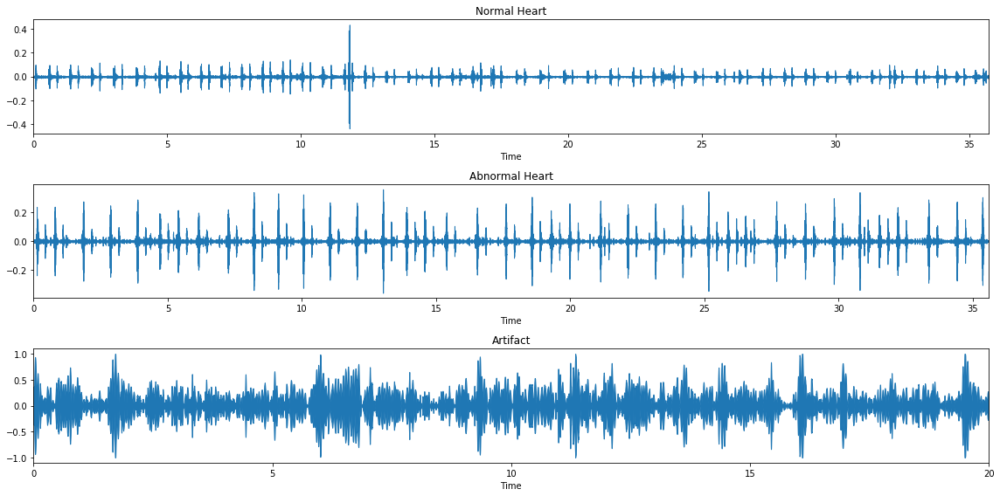

In [55]:
# librosa plot -- set-a
plt.figure(figsize=(16, 8))

plt.subplot(3, 1, 1)
y, sr = librosa.load(audio_files_a[9])
librosa.display.waveplot(y, sr=sr)
plt.title("Normal Heart")

plt.subplot(3, 1, 2)
y, sr = librosa.load(audio_files_a[10])
librosa.display.waveplot(y, sr=sr)
plt.title("Abnormal Heart")

plt.subplot(3, 1, 3)
y, sr = librosa.load(audio_files_artifacts[3])
librosa.display.waveplot(y, sr=sr)
plt.title("Artifact")

plt.tight_layout()
plt.show()

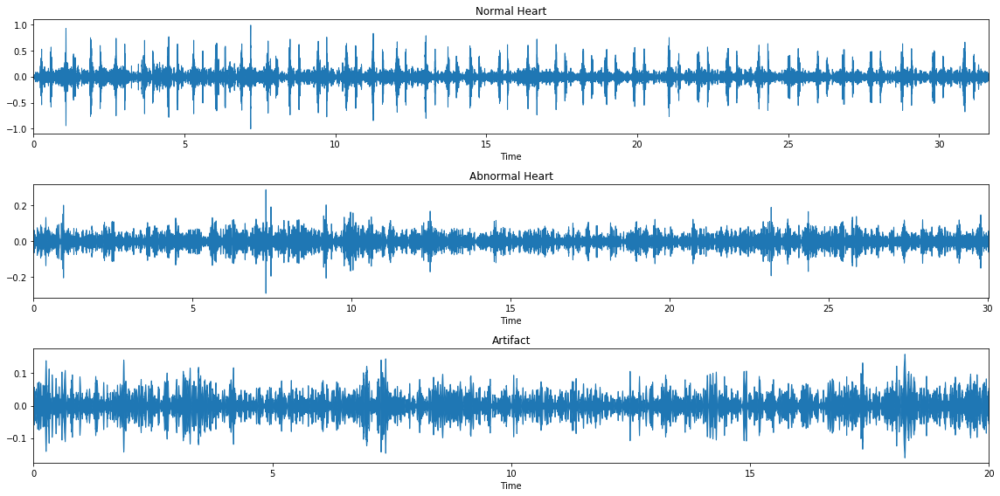

In [56]:
# librosa plot -- set-c
plt.figure(figsize=(16, 8))

plt.subplot(3, 1, 1)
y, sr = librosa.load(audio_files_c[6])
librosa.display.waveplot(y, sr=sr)
plt.title("Normal Heart")

plt.subplot(3, 1, 2)
y, sr = librosa.load(audio_files_c[7])
librosa.display.waveplot(y, sr=sr)
plt.title("Abnormal Heart")

plt.subplot(3, 1, 3)
y, sr = librosa.load(audio_files_artifacts[1])
librosa.display.waveplot(y, sr=sr)
plt.title("Artifact")

plt.tight_layout()
plt.show()

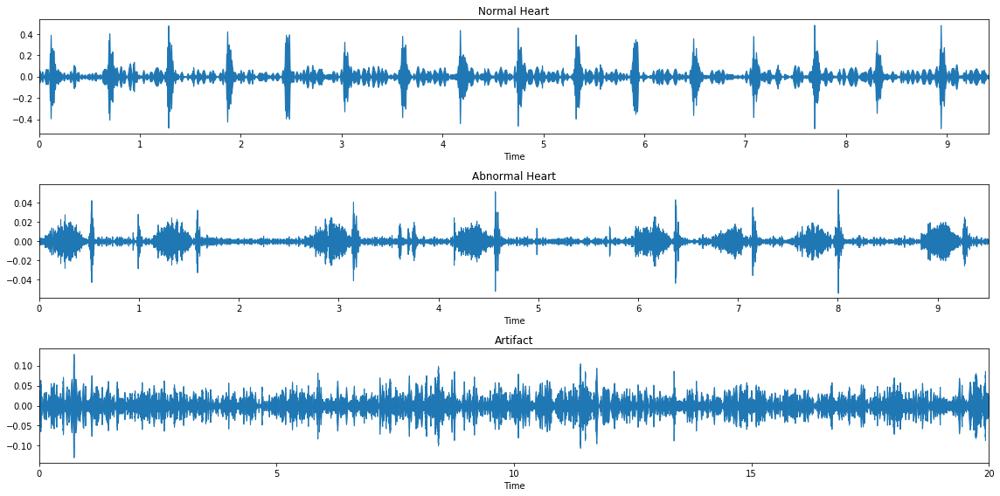

In [57]:
# librosa plot -- set-d
plt.figure(figsize=(16, 8))

plt.subplot(3, 1, 1)
y, sr = librosa.load(audio_files_d[4])
librosa.display.waveplot(y, sr=sr)
plt.title("Normal Heart")

plt.subplot(3, 1, 2)
y, sr = librosa.load(audio_files_d[3])
librosa.display.waveplot(y, sr=sr)
plt.title("Abnormal Heart")

plt.subplot(3, 1, 3)
y, sr = librosa.load(audio_files_artifacts[2])
librosa.display.waveplot(y, sr=sr)
plt.title("Artifact")

plt.tight_layout()
plt.show()

### Spectrograms

A spectrogram is the visual representation of the spectrum of frequencies of a signal as it varies with time. By converting the audio into a visual representation we can then perform similar methods of classification such as would be done when trying to classifying or identifying certain images. A famous example of this method has been done in identifying bird calls so its possible using this data will also be able to identify normal versus abnormal heart sounds. 

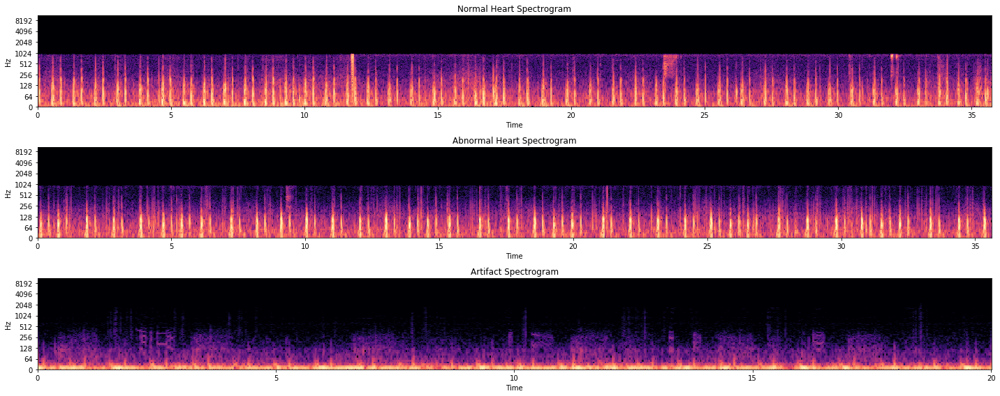

In [58]:
# librosa spectrogram plot -- set-a
plt.figure(figsize=(20, 8))

plt.subplot(3, 1, 1)
y, sr = librosa.load(audio_files_a[9])
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
librosa.display.specshow(D, x_axis='time', y_axis='log')
plt.title("Normal Heart Spectrogram")

plt.subplot(3, 1, 2)
y, sr = librosa.load(audio_files_a[10])
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
librosa.display.specshow(D, x_axis='time', y_axis='log')
plt.title("Abnormal Heart Spectrogram")

plt.subplot(3, 1, 3)
y, sr = librosa.load(audio_files_artifacts[3])
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
librosa.display.specshow(D, x_axis='time', y_axis='log')
plt.title("Artifact Spectrogram")

plt.tight_layout()
plt.show()

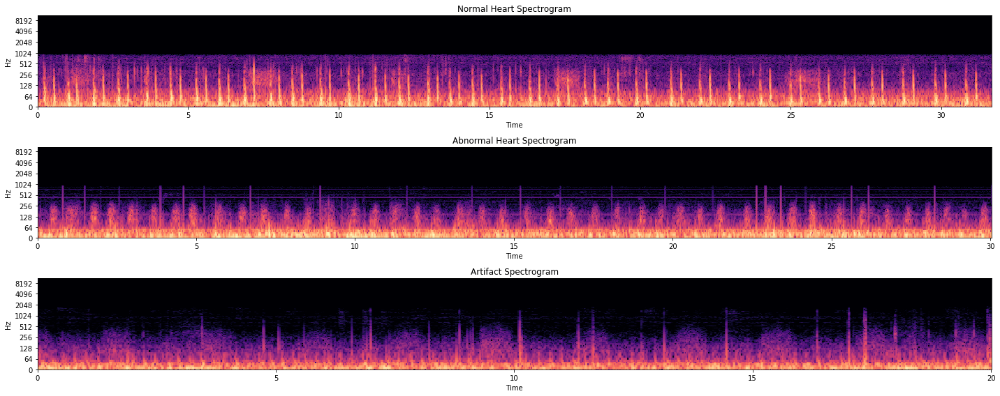

In [59]:
# librosa spectrogram plot -- set-c
plt.figure(figsize=(20, 8))

plt.subplot(3, 1, 1)
y, sr = librosa.load(audio_files_c[6])
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
librosa.display.specshow(D, x_axis='time', y_axis='log')
plt.title("Normal Heart Spectrogram")

plt.subplot(3, 1, 2)
y, sr = librosa.load(audio_files_c[7])
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
librosa.display.specshow(D, x_axis='time', y_axis='log')
plt.title("Abnormal Heart Spectrogram")

plt.subplot(3, 1, 3)
y, sr = librosa.load(audio_files_artifacts[1])
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
librosa.display.specshow(D, x_axis='time', y_axis='log')
plt.title("Artifact Spectrogram")

plt.tight_layout()
plt.show()

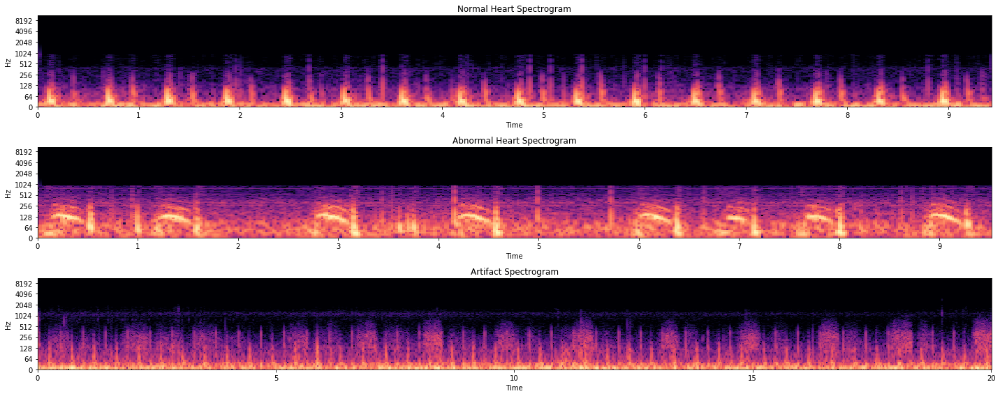

In [60]:
# librosa spectrogram plot -- set-d
plt.figure(figsize=(20, 8))

plt.subplot(3, 1, 1)
y, sr = librosa.load(audio_files_d[4])
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
librosa.display.specshow(D, x_axis='time', y_axis='log')
plt.title("Normal Heart Spectrogram")

plt.subplot(3, 1, 2)
y, sr = librosa.load(audio_files_d[3])
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
librosa.display.specshow(D, x_axis='time', y_axis='log')
plt.title("Abnormal Heart Spectrogram")

plt.subplot(3, 1, 3)
y, sr = librosa.load(audio_files_artifacts[2])
D = librosa.amplitude_to_db(np.abs(librosa.stft(y)), ref=np.max)
librosa.display.specshow(D, x_axis='time', y_axis='log')
plt.title("Artifact Spectrogram")

plt.tight_layout()
plt.show()

### Mel-frequency Cepstrums

In sound processing, the mel-frequency cepstrum (MFC) is a representation of the short-term power spectrum of a sound, based on a linear cosine transform of a log power spectrum on a nonlinear mel scale of frequency. Mel-frequency cepstral coefficients (MFCCs) are coefficients that collectively make up an MFC. They are derived from a type of cepstral representation of the audio clip (a nonlinear "spectrum-of-a-spectrum"). The difference between the cepstrum and the mel-frequency cepstrum is that in the MFC, the frequency bands are equally spaced on the mel scale, which approximates the human auditory system's response more closely than the linearly-spaced frequency bands used in the normal cepstrum. This frequency warping can allow for better representation of sound, for example, in audio compression (source: Wikipedia). 

MFCCs are commonly derived as follows:
1. Take the Fourier transform of (a windowed excerpt of) a signal.
2. Map the powers of the spectrum obtained above onto the mel scale, using triangular overlapping windows.
3. Take the logs of the powers at each of the mel frequencies.
4. Take the discrete cosine transform of the list of mel log powers, as if it were a signal.
5. The MFCCs are the amplitudes of the resulting spectrum.

MFCCs have been shown to be particularly effective in speech-recognition systems so its possible they could also be useful for our classification question. 

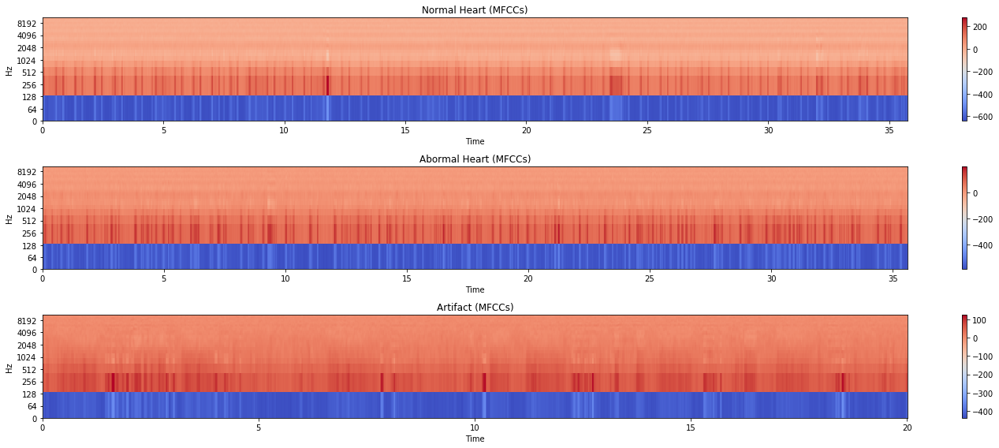

In [61]:
# librosa mfcc plot -- set-a
plt.figure(figsize=(20, 8))

plt.subplot(3, 1, 1)
y, sr = librosa.load(audio_files_a[9])
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=40)
librosa.display.specshow(mfccs, x_axis='time', y_axis='log')
plt.colorbar()
plt.title('Normal Heart (MFCCs)')

plt.subplot(3, 1, 2)
y, sr = librosa.load(audio_files_a[10])
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=40)
librosa.display.specshow(mfccs, x_axis='time', y_axis='log')
plt.colorbar()
plt.title('Abormal Heart (MFCCs)')

plt.subplot(3, 1, 3)
y, sr = librosa.load(audio_files_artifacts[3])
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=40)
librosa.display.specshow(mfccs, x_axis='time', y_axis='log')
plt.colorbar()
plt.title('Artifact (MFCCs)')

plt.tight_layout()
plt.show()

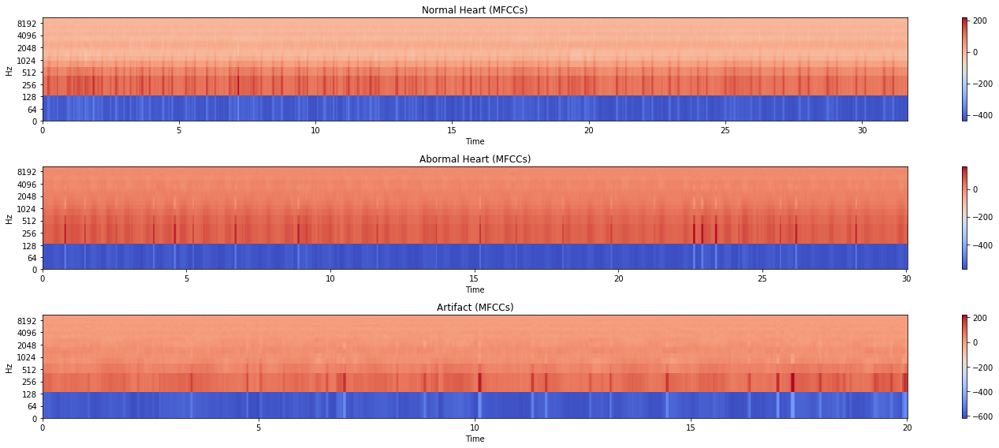

In [62]:
# librosa mfcc plot -- set-c
plt.figure(figsize=(20, 8))

plt.subplot(3, 1, 1)
y, sr = librosa.load(audio_files_c[6])
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=40)
librosa.display.specshow(mfccs, x_axis='time', y_axis='log')
plt.colorbar()
plt.title('Normal Heart (MFCCs)')

plt.subplot(3, 1, 2)
y, sr = librosa.load(audio_files_c[7])
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=40)
librosa.display.specshow(mfccs, x_axis='time', y_axis='log')
plt.colorbar()
plt.title('Abormal Heart (MFCCs)')

plt.subplot(3, 1, 3)
y, sr = librosa.load(audio_files_artifacts[1])
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=40)
librosa.display.specshow(mfccs, x_axis='time', y_axis='log')
plt.colorbar()
plt.title('Artifact (MFCCs)')

plt.tight_layout()
plt.show()

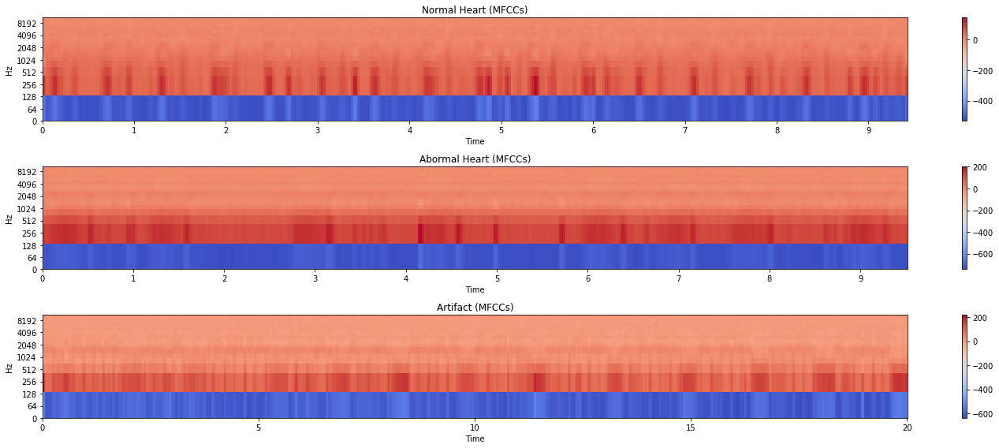

In [63]:
# librosa mfcc plot -- set-d
plt.figure(figsize=(20, 8))

plt.subplot(3, 1, 1)
y, sr = librosa.load(audio_files_d[4])
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=40)
librosa.display.specshow(mfccs, x_axis='time', y_axis='log')
plt.colorbar()
plt.title('Normal Heart (MFCCs)')

plt.subplot(3, 1, 2)
y, sr = librosa.load(audio_files_d[3])
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=40)
librosa.display.specshow(mfccs, x_axis='time', y_axis='log')
plt.colorbar()
plt.title('Abormal Heart (MFCCs)')

plt.subplot(3, 1, 3)
y, sr = librosa.load(audio_files_artifacts[2])
mfccs = librosa.feature.mfcc(y=y, sr=sr, n_mfcc=40)
librosa.display.specshow(mfccs, x_axis='time', y_axis='log')
plt.colorbar()
plt.title('Artifact (MFCCs)')

plt.tight_layout()
plt.show()

## Models

## Supervised Learning

For the first step of modelling I will try out various supervised learning models on the data and get a feel for how well we can accurately classify the sounds. In all my models I will create multiple models based off the spectrogram data and the mfcc data. Both of these features have proven effective in different forms of audio classification so it will be interesting to see which set performs better here. In my opinion the most important aspect of these models will be to first distinguish the heart sounds from the artifacts, if the model is unable to do that it will not perform well in a real-life setting. Ideally the model will be able to accurately distinguish between normal and abnormal as well, but I realize this will be a harder task. As mentioned previously there is quite a bit of class inbalance in the data so I have decided to downsample from the normal heart sounds to get a more balanced set. 

In [64]:
# Remove class imbalance
hs_normal = heart_sounds[heart_sounds.Status == 'normal']
hs_abnormal = heart_sounds[heart_sounds.Status == 'abnormal']
hs_artifact = heart_sounds[heart_sounds.Status == 'artifact']

hs_normal_downsampled = resample(hs_normal, replace = False, n_samples = 1000)
hs_downsampled = pd.concat([hs_normal_downsampled, hs_abnormal, hs_artifact])

print(hs_downsampled.Status.value_counts())

normal      1000
artifact     920
abnormal     665
Name: Status, dtype: int64


In [69]:
#spread out spec data for input into models
mean_spec = hs_downsampled['spec'].apply(pd.Series)
mean_spec = mean_spec.rename(columns = lambda x : 'spec_' + str(x))
mean_spec.head()

,spec_0,spec_1,spec_2,spec_3,spec_4,spec_5,spec_6,spec_7,spec_8,spec_9,...,spec_1015,spec_1016,spec_1017,spec_1018,spec_1019,spec_1020,spec_1021,spec_1022,spec_1023,spec_1024
1851,-27.115843,-26.838310,-26.491463,-25.933657,-25.367290,-25.198380,-25.499998,-25.808075,-26.130352,-26.438608,...,-34.842144,-34.842144,-34.842144,-34.842144,-34.842144,-34.842144,-34.842144,-34.842144,-34.842144,-34.842144
1679,-44.292767,-45.103893,-46.928791,-46.532951,-46.197197,-46.159950,-46.416821,-46.651554,-46.897469,-46.915627,...,-54.514030,-54.514034,-54.514038,-54.514042,-54.514042,-54.514034,-54.514030,-54.514015,-54.514057,-54.514103
156,-10.248750,-11.683482,-11.289666,-10.288872,-10.167762,-9.401426,-8.830644,-8.819572,-9.492872,-10.249959,...,-31.513819,-31.513819,-31.513819,-31.513819,-31.513819,-31.513819,-31.513819,-31.513819,-31.513819,-31.513819
648,-20.027487,-21.069374,-19.618399,-18.298895,-18.345036,-18.821117,-18.854389,-18.447973,-18.412138,-18.894545,...,-36.539059,-36.539059,-36.539059,-36.539059,-36.539059,-36.539059,-36.539059,-36.539059,-36.539059,-36.539059
186,20.554590,20.804884,17.590996,13.790689,10.665535,7.906461,4.624388,1.926068,-1.078533,-3.000665,...,-31.751059,-31.751059,-31.751059,-31.751059,-31.751059,-31.751059,-31.751059,-31.751059,-31.751059,-31.751059


In [71]:
X = mean_spec
target = hs_downsampled['Label']

X_train, X_test, y_train, y_test = train_test_split(X, target, train_size = 0.75)

C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2179: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


### Modelling from spectrogram data

In [72]:
# Logistic Regression Model - spectrogram
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)

print(accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(cross_val_score(lr, X, target, cv = 5))
print(classification_report(y_test, y_pred, target_names = ['normal', 'abnormal', 'artifact']))

C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


0.839258114374034
[[217  39   0]
 [ 59 103   0]
 [  4   2 223]]


C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default so

[0.86460348 0.89555126 0.75628627 0.76595745 0.68858801]
              precision    recall  f1-score   support

      normal       0.78      0.85      0.81       256
    abnormal       0.72      0.64      0.67       162
    artifact       1.00      0.97      0.99       229

   micro avg       0.84      0.84      0.84       647
   macro avg       0.83      0.82      0.82       647
weighted avg       0.84      0.84      0.84       647



In [73]:
# KNN model - spectrogram
from sklearn.neighbors import KNeighborsClassifier

neighbors = KNeighborsClassifier(n_neighbors = 1)
neighbors.fit(X_train, y_train)
y_pred = neighbors.predict(X_test)

print(accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(cross_val_score(neighbors, X, target, cv = 5))
print(classification_report(y_test, y_pred, target_names = ['normal', 'abnormal', 'artifact']))

0.8222565687789799
[[210  42   4]
 [ 49 103  10]
 [  7   3 219]]
[0.84526112 0.86073501 0.72533849 0.76402321 0.79497099]
              precision    recall  f1-score   support

      normal       0.79      0.82      0.80       256
    abnormal       0.70      0.64      0.66       162
    artifact       0.94      0.96      0.95       229

   micro avg       0.82      0.82      0.82       647
   macro avg       0.81      0.80      0.81       647
weighted avg       0.82      0.82      0.82       647



In [74]:
# Random Forest Model - spectrogram
from sklearn import ensemble

rfc = ensemble.RandomForestClassifier()
rfc.fit(X_train, y_train)
y_pred = rfc.predict(X_test)

print(accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(cross_val_score(rfc, X, target, cv = 5))
print(classification_report(y_test, y_pred, target_names = ['normal', 'abnormal', 'artifact']))

C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


0.8500772797527048
[[215  38   3]
 [ 44 112   6]
 [  5   1 223]]
[0.84719536 0.88394584 0.74468085 0.78143133 0.78143133]
              precision    recall  f1-score   support

      normal       0.81      0.84      0.83       256
    abnormal       0.74      0.69      0.72       162
    artifact       0.96      0.97      0.97       229

   micro avg       0.85      0.85      0.85       647
   macro avg       0.84      0.84      0.84       647
weighted avg       0.85      0.85      0.85       647



In [75]:
# Gradient Boosting Model -- spectrogram
params = {'n_estimators': 150,
          'max_depth': 2,
          'loss': 'deviance'}

gb = ensemble.GradientBoostingClassifier(**params)
gb.fit(X_train, y_train)

print(accuracy_score(y_test, gb.predict(X_test)))
print(confusion_matrix(y_test, y_pred))
print(cross_val_score(gb, X, target, cv = 5))
print(classification_report(y_test, y_pred, target_names = ['normal', 'abnormal', 'artifact']))

0.8624420401854714
[[215  38   3]
 [ 44 112   6]
 [  5   1 223]]
[0.88781431 0.90909091 0.72727273 0.76982592 0.76015474]
              precision    recall  f1-score   support

      normal       0.81      0.84      0.83       256
    abnormal       0.74      0.69      0.72       162
    artifact       0.96      0.97      0.97       229

   micro avg       0.85      0.85      0.85       647
   macro avg       0.84      0.84      0.84       647
weighted avg       0.85      0.85      0.85       647



### Modelling from mfcc data

In [70]:
#spread out mfcc data for input into models
mean_mfcc = hs_downsampled['mfccs_flat'].apply(pd.Series)
mean_mfcc = mean_mfcc.rename(columns = lambda x : 'mean_mfcc_' + str(x))
mean_mfcc.head()

,mean_mfcc_0,mean_mfcc_1,mean_mfcc_2,mean_mfcc_3,mean_mfcc_4,mean_mfcc_5,mean_mfcc_6,mean_mfcc_7,mean_mfcc_8,mean_mfcc_9,...,mean_mfcc_30,mean_mfcc_31,mean_mfcc_32,mean_mfcc_33,mean_mfcc_34,mean_mfcc_35,mean_mfcc_36,mean_mfcc_37,mean_mfcc_38,mean_mfcc_39
1851,-432.287231,120.720535,83.487679,40.855854,10.190581,0.131084,7.396247,20.601032,28.110966,24.843424,...,2.493945,0.333981,-1.511909,-1.752373,-0.444184,1.227809,1.954330,1.270084,-0.203468,-1.324680
1679,-619.490906,154.170059,106.874863,53.561943,15.235444,2.001541,9.420783,23.375586,30.143063,24.393114,...,0.595435,-0.155015,0.045662,0.974653,1.706835,1.520013,0.555061,-0.341646,-0.389927,0.449292
156,-363.102722,149.287720,97.457779,38.860958,-1.931777,-13.380435,-1.254204,17.768452,27.965300,23.747869,...,0.700927,-0.684168,-0.551539,0.600767,1.434305,1.023385,-0.381185,-1.660019,-1.831044,-0.841057
648,-417.213196,143.956650,95.053520,39.743710,1.227789,-9.550990,2.006349,20.129822,29.863522,25.784718,...,-0.882914,-2.429417,-2.226965,-0.540968,1.209298,1.670914,0.578112,-1.193887,-2.443785,-2.564861
186,-447.759003,57.523113,51.007175,42.429962,34.108143,27.693130,23.642363,21.328922,19.633709,17.642805,...,3.423588,3.214119,2.964634,2.690842,2.456181,2.315325,2.268172,2.257818,2.210405,2.085388


In [85]:
X = mean_mfcc
target = hs_downsampled['Label']

X_train, X_test, y_train, y_test = train_test_split(X, target, train_size = 0.75)

C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2179: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


In [86]:
# Logistic Regression Model - mfcc
from sklearn.linear_model import LogisticRegression

lr = LogisticRegression()
lr.fit(X_train, y_train)
y_pred = lr.predict(X_test)

print(accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(cross_val_score(lr, X, target, cv = 5))
print(classification_report(y_test, y_pred, target_names = ['normal', 'abnormal', 'artifact']))

C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)


0.8423493044822257
[[205  48   0]
 [ 46 108   0]
 [  7   1 232]]


C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)
C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:460: FutureWarning: Default multi_class will be changed to 'auto' in 0.22. Specify the multi_class option to silence this warning.
  "this warning.", FutureWarning)
C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default so

[0.827853   0.86073501 0.74661509 0.89748549 0.82591876]
              precision    recall  f1-score   support

      normal       0.79      0.81      0.80       253
    abnormal       0.69      0.70      0.69       154
    artifact       1.00      0.97      0.98       240

   micro avg       0.84      0.84      0.84       647
   macro avg       0.83      0.83      0.83       647
weighted avg       0.85      0.84      0.84       647



In [87]:
# KNN model - mfcc
from sklearn.neighbors import KNeighborsClassifier

neighbors = KNeighborsClassifier(n_neighbors = 1)
neighbors.fit(X_train, y_train)
y_pred = neighbors.predict(X_test)

print(accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(cross_val_score(neighbors, X, target, cv = 5))
print(classification_report(y_test, y_pred, target_names = ['normal', 'abnormal', 'artifact']))

0.8856259659969088
[[219  32   2]
 [ 26 125   3]
 [  4   7 229]]
[0.85686654 0.83365571 0.7794971  0.87814313 0.84912959]
              precision    recall  f1-score   support

      normal       0.88      0.87      0.87       253
    abnormal       0.76      0.81      0.79       154
    artifact       0.98      0.95      0.97       240

   micro avg       0.89      0.89      0.89       647
   macro avg       0.87      0.88      0.87       647
weighted avg       0.89      0.89      0.89       647



In [88]:
# Random Forest Model - mfcc
from sklearn import ensemble

rfc = ensemble.RandomForestClassifier()
rfc.fit(X_train, y_train)
y_pred = rfc.predict(X_test)

print(accuracy_score(y_test, y_pred))
print(confusion_matrix(y_test, y_pred))
print(cross_val_score(rfc, X, target, cv = 5))
print(classification_report(y_test, y_pred, target_names = ['normal', 'abnormal', 'artifact']))

C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\ensemble\forest.py:246: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


0.8809891808346213
[[226  19   8]
 [ 39 111   4]
 [  4   3 233]]
[0.8549323  0.86073501 0.76208897 0.87234043 0.86653772]
              precision    recall  f1-score   support

      normal       0.84      0.89      0.87       253
    abnormal       0.83      0.72      0.77       154
    artifact       0.95      0.97      0.96       240

   micro avg       0.88      0.88      0.88       647
   macro avg       0.88      0.86      0.87       647
weighted avg       0.88      0.88      0.88       647



In [89]:
# Gradient Boosting Model - mfcc
params = {'n_estimators': 150,
          'max_depth': 2,
          'loss': 'deviance'}

gb = ensemble.GradientBoostingClassifier(**params)
gb.fit(X_train, y_train)

print(accuracy_score(y_test, gb.predict(X_test)))
print(confusion_matrix(y_test, y_pred))
print(cross_val_score(gb, X, target, cv = 5))
print(classification_report(y_test, y_pred, target_names = ['normal', 'abnormal', 'artifact']))

0.9072642967542504
[[226  19   8]
 [ 39 111   4]
 [  4   3 233]]
[0.88394584 0.90135397 0.75435203 0.89941973 0.8762089 ]
              precision    recall  f1-score   support

      normal       0.84      0.89      0.87       253
    abnormal       0.83      0.72      0.77       154
    artifact       0.95      0.97      0.96       240

   micro avg       0.88      0.88      0.88       647
   macro avg       0.88      0.86      0.87       647
weighted avg       0.88      0.88      0.88       647



Overall, it appears modelling on the mfcc data was slightly better than the spectrogram data. Across the board the models were all slightly higher than there counterpart with the spectrogram data. Both the logistic regression and KNN models using the mfcc data did very well at separating the artifacts from the heartbeat sounds at 100% and 98% respectively. In the end all of the models performed fairly well, it will be interesting to see how the deep learning methods compare but first I will now perform unsupervised learning on the data. 

## Unsupervised Learning

Now I will perform some unsupervised learning techniques on the data to see whether or not they can correctly separate the data into the appropriate amount of clusters. 

In [76]:
#Libraries for unsupervised learning
from sklearn.cluster import KMeans
from sklearn.mixture import GaussianMixture
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn import datasets, metrics
from sklearn.manifold import TSNE
import umap

In [77]:
# Target and data for heart sounds
X = mean_spec
y = heart_sounds['Label']

# Normalize
X_std = StandardScaler().fit_transform(X)

C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning: Data with input dtype float32 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\base.py:464: DataConversionWarning: Data with input dtype float32 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


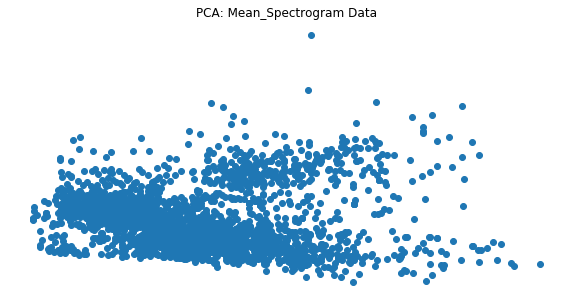

In [79]:
# visualize pca
pca = PCA(n_components=2)
pca_components = pca.fit_transform(X_std)

plt.figure(figsize=(10,5))
plt.scatter(pca_components[:, 0], pca_components[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.title("PCA: Mean_Spectrogram Data")
plt.show()

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 2585 samples in 0.160s...
[t-SNE] Computed neighbors for 2585 samples in 8.097s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2585
[t-SNE] Computed conditional probabilities for sample 2000 / 2585
[t-SNE] Computed conditional probabilities for sample 2585 / 2585
[t-SNE] Mean sigma: 1.210158
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.136490
[t-SNE] KL divergence after 300 iterations: 1.526479


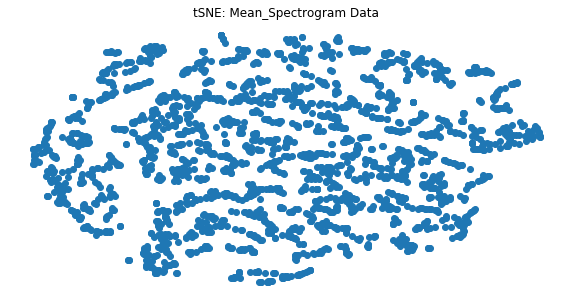

In [84]:
# visualize t-SNE
tsne = TSNE(n_components=2, verbose=1, perplexity=10, n_iter=300)
tsne_results = tsne.fit_transform(X_std)

plt.figure(figsize=(10,5))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.title("tSNE: Mean_Spectrogram Data")
plt.show()

C:\Users\mike1\Anaconda3\lib\site-packages\umap\spectral.py:229: UserWarning: Embedding a total of 7 separate connected components using meta-embedding (experimental)
  n_components


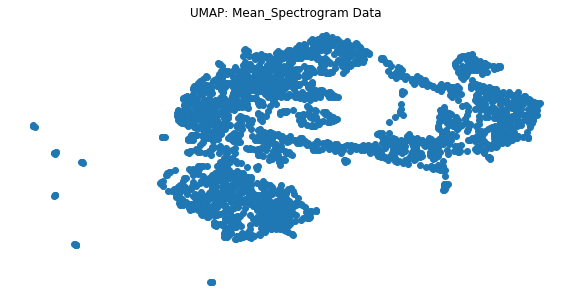

In [80]:
# visualize UMAP
umap_results = umap.UMAP(n_neighbors=5,
                      min_dist=0.5,
                      metric='correlation').fit_transform(X_std)

plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.title("UMAP: Mean_Spectrogram Data")
plt.show()

In [81]:
## Check which number of clusters works best
n_clusters = [2, 3, 4, 5]

In [82]:
def compare_k_means(k_list, data):
    ## Run clustering with different k and check the metrics
    for k in k_list:
        clusterer = KMeans(n_clusters=k, random_state=123)
        clusterer.fit(data)
        ##
        print("Adjusted Rand Index for k == {}: {}".format(k, metrics.adjusted_rand_score(target, clusterer.labels_)))
        print("Silhouette Coefficient for k == {}: {}".format(k, metrics.silhouette_score(data, clusterer.labels_)))
        print("\n")

In [83]:
# Evaluate k-means for the spectrogram data
compare_k_means(n_clusters, X)

Adjusted Rand Index for k == 2: 0.0407877639661572
Silhouette Coefficient for k == 2: 0.5159174799919128


Adjusted Rand Index for k == 3: 0.0836771129038708
Silhouette Coefficient for k == 3: 0.4505777657032013


Adjusted Rand Index for k == 4: 0.05958648929643832
Silhouette Coefficient for k == 4: 0.4252191185951233


Adjusted Rand Index for k == 5: 0.060566773503049266
Silhouette Coefficient for k == 5: 0.3786359131336212




Going through the spectrogram results we see that the best cluster scores for both the ARI and silhouette metrics were achieved at k=2. It could be the case that it is separating out the heartbeat sounds, both normal and abnormal, from the artifact group. Visually, the UMAP method appears to have done the best job at separating the data as there are two pretty distinct groupings. The PCA method also appears to have separated out the groups, although not as distinctly as the UMAP.

In [90]:
# Target and data for heart sounds
X = mean_mfcc
y = heart_sounds['Label']

# Normalize
X_std = StandardScaler().fit_transform(X)

C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\preprocessing\data.py:645: DataConversionWarning: Data with input dtype float32 were all converted to float64 by StandardScaler.
  return self.partial_fit(X, y)
C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\base.py:464: DataConversionWarning: Data with input dtype float32 were all converted to float64 by StandardScaler.
  return self.fit(X, **fit_params).transform(X)


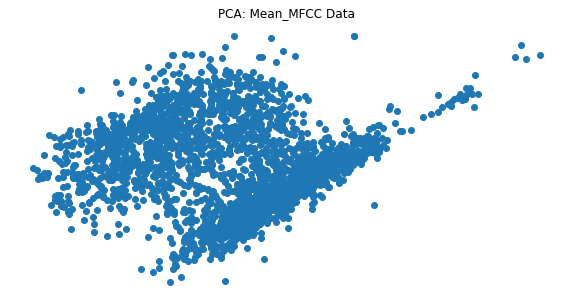

In [91]:
# visualize pca
pca = PCA(n_components=2)
pca_components = pca.fit_transform(X_std)

plt.figure(figsize=(10,5))
plt.scatter(pca_components[:, 0], pca_components[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.title("PCA: Mean_MFCC Data")
plt.show()

[t-SNE] Computing 31 nearest neighbors...
[t-SNE] Indexed 2585 samples in 0.008s...
[t-SNE] Computed neighbors for 2585 samples in 0.550s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2585
[t-SNE] Computed conditional probabilities for sample 2000 / 2585
[t-SNE] Computed conditional probabilities for sample 2585 / 2585
[t-SNE] Mean sigma: 1.126228
[t-SNE] KL divergence after 250 iterations with early exaggeration: 77.591232
[t-SNE] KL divergence after 300 iterations: 1.918212


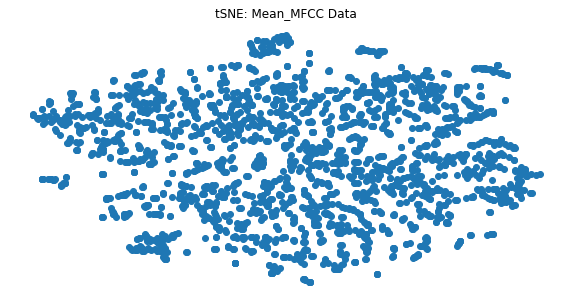

In [92]:
# visualize t-SNE
tsne = TSNE(n_components=2, verbose=1, perplexity=10, n_iter=300)
tsne_results = tsne.fit_transform(X_std)

plt.figure(figsize=(10,5))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.title("tSNE: Mean_MFCC Data")
plt.show()

C:\Users\mike1\Anaconda3\lib\site-packages\umap\spectral.py:229: UserWarning: Embedding a total of 2 separate connected components using meta-embedding (experimental)
  n_components


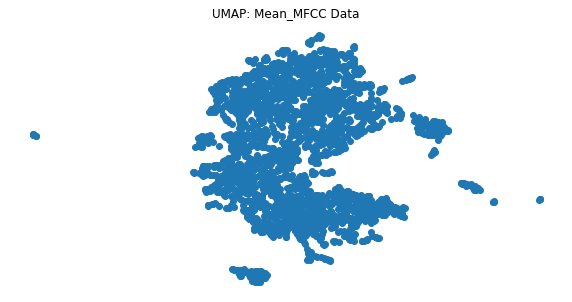

In [93]:
# visualize UMAP
umap_results = umap.UMAP(n_neighbors=5,
                      min_dist=0.5,
                      metric='correlation').fit_transform(X_std)

plt.figure(figsize=(10,5))
plt.scatter(umap_results[:, 0], umap_results[:, 1])
plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.title("UMAP: Mean_MFCC Data")
plt.show()

In [94]:
# Evaluate k-means for the mfcc data
compare_k_means(n_clusters, X)

Adjusted Rand Index for k == 2: 0.19789223696392935
Silhouette Coefficient for k == 2: 0.4333522915840149


Adjusted Rand Index for k == 3: 0.192034541468823
Silhouette Coefficient for k == 3: 0.4180149435997009


Adjusted Rand Index for k == 4: 0.21873763068763036
Silhouette Coefficient for k == 4: 0.35806727409362793


Adjusted Rand Index for k == 5: 0.1967085727379228
Silhouette Coefficient for k == 5: 0.3317842483520508




Overall, it appears that unsupervised learning on the spectrogram data produced better results than the mfcc data. Visually, there were more distinct groupings with the spectrogram data and the silhouette scores were better across the board as well. Interestingly, the ARI scores were higher for the mfcc data, however the highest ocurred at k=4 while the lowest score happened to be at k=3 which is what we would assume to be the highest. 

## Deep Learning

I will now see how two different neural networks perform in classifying heart sounds. First I will deploy a traditional MLP neural network on the data. Then I will use an LSTM neural network and compare how both perform. LSTMs (long short-term memory) are a type of recurrent neural network that have proven effective in modeling and predicting on sequences of data such as video analysis or speech recognition. They were developed to solve the exploding and vanishing gradient problem that plagues other recurrent neural networks. They achieve this through cells that contain an input gate, output gate and forget gate and together these regulate the flow of information into and out of each cell. My hypothesis is that the LSTM will be able to identify the sequencing with the heartbeat sounds to better classify and ultimately be the best performing model. First however, I will need to format the data to get it into shape for the neural networks.  

#### Format data for neural networks

In [114]:
x_data = np.concatenate((A_sounds_spec, B_sounds_spec, C_sounds_spec, D_sounds_spec, E_sounds_spec, F_sounds_spec, artifact_sounds_spec))
x_data.shape

(4160, 1025)

In [100]:
# Map label text to integer
CLASSES = ['normal','abnormal', 'artifact']
NB_CLASSES=len(CLASSES)

# Map integer value to text labels
label_to_int = {k:v for v,k in enumerate(CLASSES)}
print (label_to_int)
print (" ")
# map integer to label text
int_to_label = {v:k for k,v in label_to_int.items()}
print(int_to_label)

{'normal': 0, 'abnormal': 1, 'artifact': 2}
 
{0: 'normal', 1: 'abnormal', 2: 'artifact'}


In [101]:
y_data = heart_sounds['Label']
y_data.shape

(4160,)

In [115]:
seed=1234
x_train, x_test, y_train, y_test = train_test_split(x_data, y_data, train_size=0.9, random_state=seed, shuffle=True)
y_train = np.array(keras.utils.to_categorical(y_train, len(CLASSES)))
y_test = np.array(keras.utils.to_categorical(y_test, len(CLASSES)))

C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2179: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


In [116]:
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(3744, 1025)
(416, 1025)
(3744, 3)
(416, 3)


### MLP for spectrogram data

In [105]:
# Start with a simple sequential model
model = Sequential()

# Add dense layers to create a fully connected MLP
model.add(Dense(64, activation='relu', input_shape=(1025,)))
# Dropout layers remove features and fight overfitting
model.add(Dropout(0.1))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.1))
# End with a number of units equal to the number of classes we have for our outcome
model.add(Dense(3, activation='softmax'))

model.summary()

# Compile the model to put it all together.
model.compile(loss='categorical_crossentropy',
              optimizer=RMSprop(),
              metrics=['accuracy'])

history = model.fit(x_train, y_train,
                    batch_size=128,
                    epochs=10,
                    verbose=1,
                    validation_data=(x_test_, y_test))
score = model.evaluate(x_test, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 64)                65664     
_________________________________________________________________
dropout_3 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_5 (Dense)              (None, 64)                4160      
_________________________________________________________________
dropout_4 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_6 (Dense)              (None, 3)                 195       
Total params: 70,019
Trainable params: 70,019
Non-trainable params: 0
_________________________________________________________________
Train on 3744 samples, validate on 416 samples
Epoch 1/10
3744/3744 [==============================] - ETA: 19s - lo

In [106]:
predictions = model.predict(x_test)
y_pred = (predictions > 0.5)

print(metrics.confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1)))
print(classification_report(y_test.argmax(axis=1), y_pred.argmax(axis=1)))

[[250   0   0]
 [ 65   0   0]
 [101   0   0]]


C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1143: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


              precision    recall  f1-score   support

           0       0.60      1.00      0.75       250
           1       0.00      0.00      0.00        65
           2       0.00      0.00      0.00       101

   micro avg       0.60      0.60      0.60       416
   macro avg       0.20      0.33      0.25       416
weighted avg       0.36      0.60      0.45       416



### MLP & LSTM on mfcc data

In [108]:
x_data = np.concatenate((A_sounds_mfcc, B_sounds_mfcc, C_sounds_mfcc, D_sounds_mfcc, E_sounds_mfcc, F_sounds_mfcc, artifact_sounds_mfcc))
x_data.shape

(4160, 40, 1)

In [109]:
seed=1234
x_train, x_test, y_train, y_test = train_test_split(x_data, y_data, train_size=0.9, random_state=seed, shuffle=True)
y_train = np.array(keras.utils.to_categorical(y_train, len(CLASSES)))
y_test = np.array(keras.utils.to_categorical(y_test, len(CLASSES)))

C:\Users\mike1\Anaconda3\lib\site-packages\sklearn\model_selection\_split.py:2179: FutureWarning: From version 0.21, test_size will always complement train_size unless both are specified.
  FutureWarning)


In [110]:
x_train_ = x_train.reshape(3744, 40)
x_test_ = x_test.reshape(416, 40)

# Start with a simple sequential model
model = Sequential()

# Add dense layers to create a fully connected MLP
# Note that we specify an input shape for the first layer, but only the first layer.
# Relu is the activation function used
model.add(Dense(64, activation='relu', input_shape=(40,)))
# Dropout layers remove features and fight overfitting
model.add(Dropout(0.1))
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.1))
# End with a number of units equal to the number of classes we have for our outcome
model.add(Dense(3, activation='softmax'))

model.summary()

# Compile the model to put it all together.
model.compile(loss='categorical_crossentropy',
              optimizer=RMSprop(),
              metrics=['accuracy'])

history = model.fit(x_train_, y_train,
                    batch_size=128,
                    epochs=10,
                    verbose=1,
                    validation_data=(x_test_, y_test))
score = model.evaluate(x_test_, y_test, verbose=0)
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_8 (Dense)              (None, 64)                2624      
_________________________________________________________________
dropout_5 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_9 (Dense)              (None, 64)                4160      
_________________________________________________________________
dropout_6 (Dropout)          (None, 64)                0         
_________________________________________________________________
dense_10 (Dense)             (None, 3)                 195       
Total params: 6,979
Trainable params: 6,979
Non-trainable params: 0
_________________________________________________________________
Train on 3744 samples, validate on 416 samples
Epoch 1/10
3744/3744 [==============================] - ETA: 3s - loss:

In [111]:
predictions = model.predict(x_test_)
y_pred = (predictions > 0.5)

print(metrics.confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1)))
print(classification_report(y_test.argmax(axis=1), y_pred.argmax(axis=1)))

[[238  12   0]
 [ 35  29   1]
 [ 13   0  88]]
              precision    recall  f1-score   support

           0       0.83      0.95      0.89       250
           1       0.71      0.45      0.55        65
           2       0.99      0.87      0.93       101

   micro avg       0.85      0.85      0.85       416
   macro avg       0.84      0.76      0.79       416
weighted avg       0.85      0.85      0.84       416



In [112]:
print('LSTM model: MFCC Data')
model = Sequential()
model.add(LSTM(units=64, dropout=0.05, recurrent_dropout=0.20, return_sequences=True, input_shape = (40,1)))
model.add(LSTM(units=64, dropout=0.05, recurrent_dropout=0.20, return_sequences=True))
model.add(LSTM(units=16, dropout=0.05, recurrent_dropout=0.20, return_sequences=False))
model.add(Dense(3, activation='softmax'))
model.compile(loss='categorical_crossentropy', optimizer='Adamax', metrics=['acc','mse', 'mae', 'mape', 'cosine'])
model.summary()

print ("training started..... please wait.")
# training
history=model.fit(x_train, y_train, 
                  batch_size=MAX_BATCH, 
                  epochs=MAX_EPOCHS,
                  verbose=0,
                  callbacks=callback) 

print ("training finised!")

# Keras reported accuracy:
score = model.evaluate(x_train, y_train, verbose=0) 
print ("model train data score       : ",round(score[1]*100) , "%")

score = model.evaluate(x_test, y_test, verbose=0) 
print ("model test data score        : ",round(score[1]*100) , "%")

LSTM model: Spectrogram Data
Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_4 (LSTM)                (None, 40, 64)            16896     
_________________________________________________________________
lstm_5 (LSTM)                (None, 40, 64)            33024     
_________________________________________________________________
lstm_6 (LSTM)                (None, 16)                5184      
_________________________________________________________________
dense_11 (Dense)             (None, 3)                 51        
Total params: 55,155
Trainable params: 55,155
Non-trainable params: 0
_________________________________________________________________
training started..... please wait.


C:\Users\mike1\Anaconda3\lib\site-packages\keras\callbacks\callbacks.py:1042: RuntimeWarning: Reduce LR on plateau conditioned on metric `val_loss` which is not available. Available metrics are: loss,acc,mse,mae,mape,cosine,lr
  (self.monitor, ','.join(list(logs.keys()))), RuntimeWarning



Epoch 00001: loss improved from inf to 0.80689, saving model to ./best_model_trained.hdf5

Epoch 00002: loss improved from 0.80689 to 0.71003, saving model to ./best_model_trained.hdf5

Epoch 00003: loss improved from 0.71003 to 0.69126, saving model to ./best_model_trained.hdf5

Epoch 00004: loss improved from 0.69126 to 0.66105, saving model to ./best_model_trained.hdf5

Epoch 00005: loss improved from 0.66105 to 0.63227, saving model to ./best_model_trained.hdf5

Epoch 00006: loss improved from 0.63227 to 0.59241, saving model to ./best_model_trained.hdf5

Epoch 00007: loss improved from 0.59241 to 0.55685, saving model to ./best_model_trained.hdf5

Epoch 00008: loss improved from 0.55685 to 0.54492, saving model to ./best_model_trained.hdf5

Epoch 00009: loss improved from 0.54492 to 0.51394, saving model to ./best_model_trained.hdf5

Epoch 00010: loss improved from 0.51394 to 0.50228, saving model to ./best_model_trained.hdf5

Epoch 00011: loss improved from 0.50228 to 0.49652, s

In [113]:
predictions = model.predict(x_test)
y_pred = (predictions > 0.5)

print(metrics.confusion_matrix(y_test.argmax(axis=1), y_pred.argmax(axis=1)))
print(classification_report(y_test.argmax(axis=1), y_pred.argmax(axis=1)))

[[240   9   1]
 [ 20  45   0]
 [  3   0  98]]
              precision    recall  f1-score   support

           0       0.91      0.96      0.94       250
           1       0.83      0.69      0.76        65
           2       0.99      0.97      0.98       101

   micro avg       0.92      0.92      0.92       416
   macro avg       0.91      0.87      0.89       416
weighted avg       0.92      0.92      0.92       416



## Conclusions and Further Steps

Overall, the models have all shown pretty high accuracy which is a good sign. In my opinion the most important aspect of these models is there ability to accurately distinguish the artifacts from the rest of the data and all the models have done that pretty well. While the accuracy at distinguishing between normal and abnormal is not as good yet, I think with more data the models would begin to start recognizing some of the subtle differences. I think this is particularly true of the LSTM neural network which I still believe would be the top choice if more data were available. As is, I think the LSTM model in particular could have great value in both clinical or non-clinical settings in correctly classifying heartbeat abnormalities. If given to an experienced doctor I think it would be a good supplement to their previous knowledge and would help to verify any of their findings. For someone with little or no medical training, such a device could be useful in identifying if there is an issue with someone and if they need to be taken to a professional for further treatment. All in all, I think this model has the potential to improve patient outcomes and maybe even save lives.

For further study I think it is absolutely essential to get a hold of more data and continue to refine the models. For me, the endgame would be to not only distinguish between normal and abnormal, but to be able to specifically say what the problem is if present. There are many, many issues that can go wrong with the heart so being able to quickly and accurately diagnose the specific problem would be the ultimate goal. Again this would take a much larger effort and significantly more data but I think this project is a good starting point and proof of concept. 